# Autoencoders and Denoising Autoencoders using TensorFlow and the MNIST Dataset

In [1]:
import numpy as np
import sys
import tensorflow as tf
import time

import load_mnist

from sklearn.ensemble import RandomForestClassifier

%matplotlib inline
from IPython.core.pylabtools import figsize
import matplotlib.pyplot as plt
from matplotlib import cm
figsize(4, 4)

## Fetch and Read In Data

In [2]:
train_im, test_im, train_labels, test_labels = load_mnist.Datasets()

## Some Utility Functions

In [1]:
def weight_variable(shape, init=0.01):
    initial = tf.random_uniform(shape, minval=-init, maxval=init)
    return tf.Variable(initial, name="weights")

def bias_variable(shape, init=0.01):
    initial = tf.constant(init, shape=shape)
    return tf.Variable(initial, name="bias")

def elu(x):
    pos = tf.cast(tf.greater_equal(x, 0), tf.float32)
    return (pos * x) + ((1 - pos) * (tf.exp(x) - 1))

def HiddenLayer(inp, shape, nonlin=elu, init=0.001, scope="RBM"):
    with tf.name_scope(scope) as ns:
        W = weight_variable(shape, init=init)
        b = bias_variable([shape[1]], init=init)
        h = nonlin(tf.matmul(inp, W) + b)
        return W, b, h

## Deep Autoencoder
There are two strategies to building autoencoders: either train all the layers at the same time, or train each layer in isolation, and freeze it before moving on to the next. The second approach isn't needed for something as simple as the MNIST dataset.

If we wanted a denoising autoencoder, all we'd have to do is randomly corrupt the inputs a bit. The classic corruption technique randomly sets half of the input pixels to 0. I'll demonstrate later that even without this variation, our autoencoder develops internal representations capable of very slightly reconstructing noisy inputs.

In [38]:
try:
    del(sess)
    print "deleted session"
except Exception as e:
    print "no existing session to delete"
sess = tf.InteractiveSession()

deleted session


#### Inputs

In [39]:
x = tf.placeholder(tf.float32, shape=[None, 28, 28])

#### Internal Structure and Outputs

In [40]:
# Munge input
with tf.name_scope("enc_input") as scope:
    x_scaled = x / 255.0
    x_flat = tf.reshape(x_scaled, [-1, 28 * 28])

# Encoder
W_enc1, b_enc1, h_enc1 = HiddenLayer(
    x_flat, [28 * 28, 256], scope="enc1")
W_enc2, b_enc2, h_enc2 = HiddenLayer(
    h_enc1, [256, 128], scope="enc2")
W_enc3, b_enc3, h_enc3 = HiddenLayer(
    h_enc2, [128, 64], scope="enc3")
W_enc4, b_enc4, h_enc4 = HiddenLayer(
    h_enc3, [64, 32], scope="enc4")

# Decoder
W_dec4, b_dec4, h_dec4 = HiddenLayer(
    h_enc4, [32, 64], scope="dec5")
W_dec3, b_dec3, h_dec3 = HiddenLayer(
    h_dec4, [64, 128], scope="dec4")
W_dec2, b_dec2, h_dec2 = HiddenLayer(
    h_dec3, [128, 256], scope="dec2")
W_dec1, b_dec1, h_dec1 = HiddenLayer(
    h_dec2, [256, 28 * 28], nonlin=tf.nn.sigmoid, scope="dec1")

# Munge output
with tf.name_scope("dec_output") as scope:
    y = tf.reshape(h_dec1, [-1, 28, 28])
    y_image = 255 * y

#### Training, Evaluation, and Initialization

In [41]:
mse = tf.reduce_mean(tf.pow(y - x_scaled, 2))
train_step = tf.train.AdamOptimizer(0.001).minimize(mse)

sess.run(tf.initialize_all_variables())

#### Main loop


START OF EPOCH 0: MSE=2.317e-01


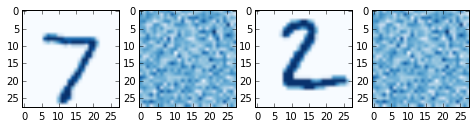

Finished epoch 0, batch 249 after 8.23 sec: MSE=6.215e-02, max activation=1.934e+00
Finished epoch 0, batch 499 after 15.41 sec: MSE=6.085e-02, max activation=2.256e+00

START OF EPOCH 1: MSE=6.354e-02


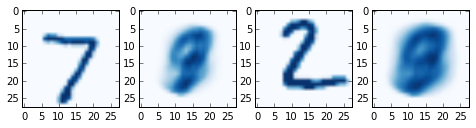

Finished epoch 1, batch 249 after 27.55 sec: MSE=6.021e-02, max activation=2.520e+00
Finished epoch 1, batch 499 after 37.10 sec: MSE=5.941e-02, max activation=2.703e+00

START OF EPOCH 2: MSE=6.547e-02


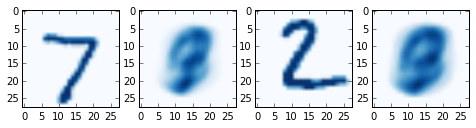

Finished epoch 2, batch 249 after 51.26 sec: MSE=5.930e-02, max activation=3.282e+00
Finished epoch 2, batch 499 after 60.74 sec: MSE=5.796e-02, max activation=4.104e+00

START OF EPOCH 3: MSE=6.082e-02


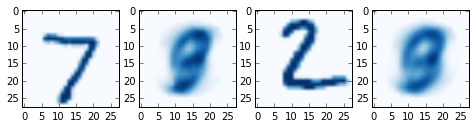

Finished epoch 3, batch 249 after 72.12 sec: MSE=5.681e-02, max activation=6.475e+00
Finished epoch 3, batch 499 after 79.68 sec: MSE=5.587e-02, max activation=1.402e+01

START OF EPOCH 4: MSE=5.852e-02


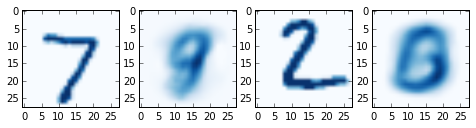

Finished epoch 4, batch 249 after 90.96 sec: MSE=5.629e-02, max activation=2.194e+01
Finished epoch 4, batch 499 after 99.04 sec: MSE=5.479e-02, max activation=2.717e+01

START OF EPOCH 5: MSE=5.763e-02


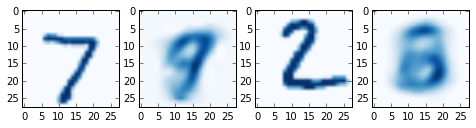

Finished epoch 5, batch 249 after 109.68 sec: MSE=5.445e-02, max activation=2.837e+01
Finished epoch 5, batch 499 after 118.00 sec: MSE=5.324e-02, max activation=3.097e+01

START OF EPOCH 6: MSE=5.625e-02


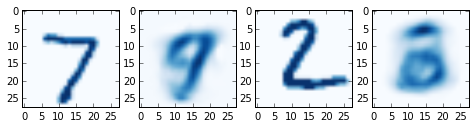

Finished epoch 6, batch 249 after 129.81 sec: MSE=4.900e-02, max activation=3.448e+01
Finished epoch 6, batch 499 after 137.59 sec: MSE=4.733e-02, max activation=3.604e+01

START OF EPOCH 7: MSE=4.878e-02


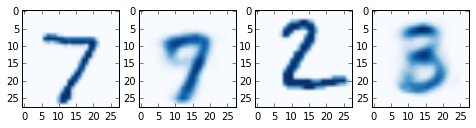

Finished epoch 7, batch 249 after 150.33 sec: MSE=4.400e-02, max activation=4.321e+01
Finished epoch 7, batch 499 after 159.05 sec: MSE=4.292e-02, max activation=4.334e+01

START OF EPOCH 8: MSE=4.438e-02


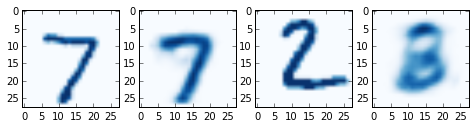

Finished epoch 8, batch 249 after 171.49 sec: MSE=4.083e-02, max activation=3.609e+01
Finished epoch 8, batch 499 after 179.36 sec: MSE=3.900e-02, max activation=4.009e+01

START OF EPOCH 9: MSE=3.952e-02


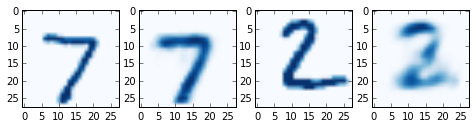

Finished epoch 9, batch 249 after 192.28 sec: MSE=3.651e-02, max activation=4.064e+01
Finished epoch 9, batch 499 after 200.26 sec: MSE=3.595e-02, max activation=3.987e+01

START OF EPOCH 10: MSE=3.777e-02


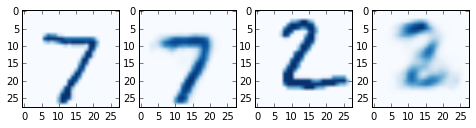

Finished epoch 10, batch 249 after 212.24 sec: MSE=3.431e-02, max activation=3.608e+01
Finished epoch 10, batch 499 after 219.57 sec: MSE=3.292e-02, max activation=4.150e+01

START OF EPOCH 11: MSE=3.610e-02


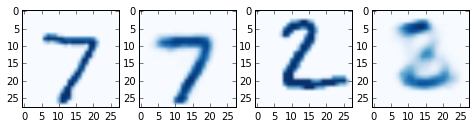

Finished epoch 11, batch 249 after 231.48 sec: MSE=3.115e-02, max activation=3.872e+01
Finished epoch 11, batch 499 after 238.92 sec: MSE=3.037e-02, max activation=3.669e+01

START OF EPOCH 12: MSE=3.267e-02


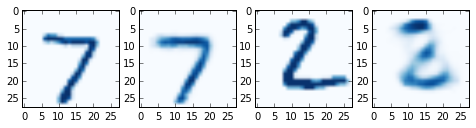

Finished epoch 12, batch 249 after 250.09 sec: MSE=2.843e-02, max activation=3.315e+01
Finished epoch 12, batch 499 after 258.46 sec: MSE=2.762e-02, max activation=3.406e+01

START OF EPOCH 13: MSE=3.042e-02


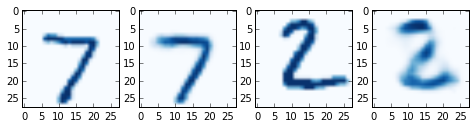

Finished epoch 13, batch 249 after 270.31 sec: MSE=2.675e-02, max activation=3.085e+01
Finished epoch 13, batch 499 after 277.28 sec: MSE=2.615e-02, max activation=3.041e+01

START OF EPOCH 14: MSE=2.870e-02


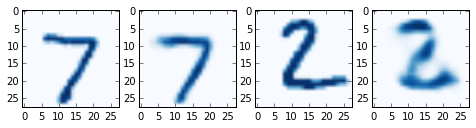

Finished epoch 14, batch 249 after 288.92 sec: MSE=2.570e-02, max activation=2.775e+01
Finished epoch 14, batch 499 after 296.55 sec: MSE=2.512e-02, max activation=2.758e+01

START OF EPOCH 15: MSE=2.697e-02


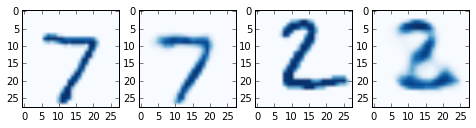

Finished epoch 15, batch 249 after 308.28 sec: MSE=2.453e-02, max activation=2.591e+01
Finished epoch 15, batch 499 after 315.23 sec: MSE=2.392e-02, max activation=2.498e+01

START OF EPOCH 16: MSE=2.617e-02


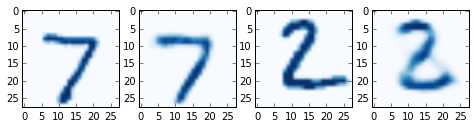

Finished epoch 16, batch 249 after 326.19 sec: MSE=2.307e-02, max activation=2.559e+01
Finished epoch 16, batch 499 after 333.98 sec: MSE=2.198e-02, max activation=2.419e+01

START OF EPOCH 17: MSE=2.411e-02


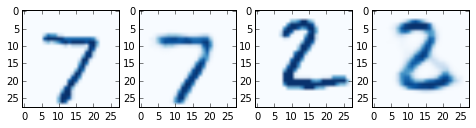

Finished epoch 17, batch 249 after 346.40 sec: MSE=2.114e-02, max activation=2.425e+01
Finished epoch 17, batch 499 after 353.65 sec: MSE=2.089e-02, max activation=2.283e+01

START OF EPOCH 18: MSE=2.211e-02


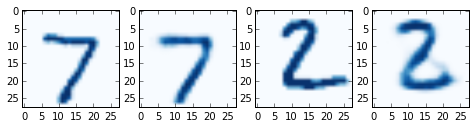

Finished epoch 18, batch 249 after 365.08 sec: MSE=2.020e-02, max activation=2.337e+01
Finished epoch 18, batch 499 after 372.26 sec: MSE=1.999e-02, max activation=2.290e+01

START OF EPOCH 19: MSE=2.187e-02


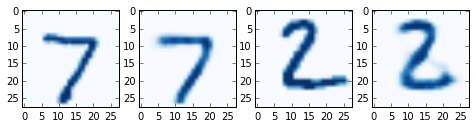

Finished epoch 19, batch 249 after 383.27 sec: MSE=1.946e-02, max activation=2.271e+01
Finished epoch 19, batch 499 after 390.17 sec: MSE=1.919e-02, max activation=2.234e+01

START OF EPOCH 20: MSE=2.058e-02


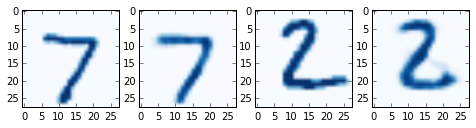

Finished epoch 20, batch 249 after 400.49 sec: MSE=1.867e-02, max activation=2.233e+01
Finished epoch 20, batch 499 after 407.75 sec: MSE=1.820e-02, max activation=2.141e+01

START OF EPOCH 21: MSE=1.926e-02


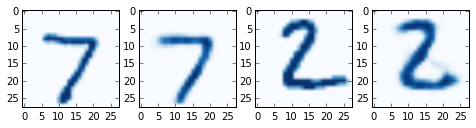

Finished epoch 21, batch 249 after 418.32 sec: MSE=1.771e-02, max activation=2.243e+01
Finished epoch 21, batch 499 after 425.95 sec: MSE=1.723e-02, max activation=2.147e+01

START OF EPOCH 22: MSE=1.844e-02


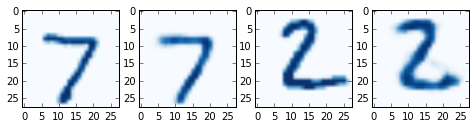

Finished epoch 22, batch 249 after 436.52 sec: MSE=1.689e-02, max activation=2.195e+01
Finished epoch 22, batch 499 after 444.06 sec: MSE=1.645e-02, max activation=2.086e+01

START OF EPOCH 23: MSE=1.741e-02


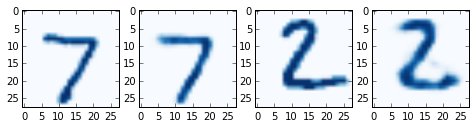

Finished epoch 23, batch 249 after 455.71 sec: MSE=1.618e-02, max activation=2.167e+01
Finished epoch 23, batch 499 after 463.28 sec: MSE=1.574e-02, max activation=2.078e+01

START OF EPOCH 24: MSE=1.649e-02


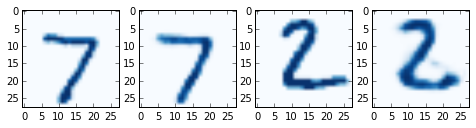

Finished epoch 24, batch 249 after 474.79 sec: MSE=1.558e-02, max activation=2.121e+01
Finished epoch 24, batch 499 after 482.13 sec: MSE=1.524e-02, max activation=2.013e+01

START OF EPOCH 25: MSE=1.593e-02


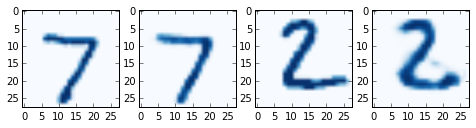

Finished epoch 25, batch 249 after 493.69 sec: MSE=1.508e-02, max activation=2.034e+01
Finished epoch 25, batch 499 after 501.28 sec: MSE=1.486e-02, max activation=1.944e+01

START OF EPOCH 26: MSE=1.557e-02


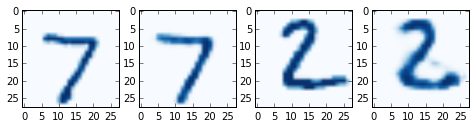

Finished epoch 26, batch 249 after 512.73 sec: MSE=1.466e-02, max activation=1.961e+01
Finished epoch 26, batch 499 after 520.10 sec: MSE=1.448e-02, max activation=1.896e+01

START OF EPOCH 27: MSE=1.531e-02


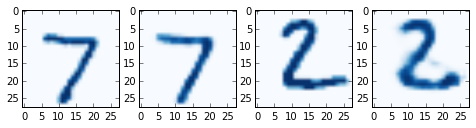

Finished epoch 27, batch 249 after 532.06 sec: MSE=1.422e-02, max activation=1.889e+01
Finished epoch 27, batch 499 after 538.91 sec: MSE=1.404e-02, max activation=1.852e+01

START OF EPOCH 28: MSE=1.498e-02


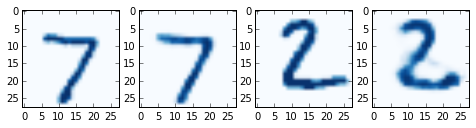

Finished epoch 28, batch 249 after 549.65 sec: MSE=1.381e-02, max activation=1.760e+01
Finished epoch 28, batch 499 after 555.92 sec: MSE=1.356e-02, max activation=1.723e+01

START OF EPOCH 29: MSE=1.441e-02


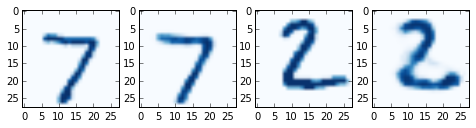

Finished epoch 29, batch 249 after 566.38 sec: MSE=1.350e-02, max activation=1.717e+01
Finished epoch 29, batch 499 after 572.81 sec: MSE=1.307e-02, max activation=1.705e+01


In [75]:
num_epochs = 30
batch_size = 100
test_every_n_batches = 250

figsize(8, 2)

batches_per_epoch = train_im.shape[0] / batch_size
mark = time.time()
for ep in xrange(num_epochs):
    er = mse.eval(feed_dict={x: test_im})
    print "\nSTART OF EPOCH {ep}: MSE={er:.3e}".format(ep=ep, er=er)
    _, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4)
    ax1.imshow(test_im[0], cmap=cm.Blues)
    ax2.imshow(y_image.eval(feed_dict={x: test_im[0:1]}).reshape(28, 28), cmap=cm.Blues)
    ax3.imshow(test_im[1], cmap=cm.Blues)
    ax4.imshow(y_image.eval(feed_dict={x: test_im[1:2]}).reshape(28, 28), cmap=cm.Blues)
    plt.show()
    for i in xrange(batches_per_epoch):
        start_offset = i * batch_size
        stop_offset = start_offset + batch_size
        train_step.run(feed_dict={x: train_im[start_offset:stop_offset]})
        if (i + 1) % test_every_n_batches == 0:
            er, he1, he2, hd1, hd2 = sess.run(
                [mse, h_enc1, h_enc2, h_dec1, h_dec2],
                feed_dict={x: test_im[:100]})
            mv = max(he1.max(), he2.max(), hd1.max(), hd2.max())
            print ("Finished epoch {ep}, batch {ba} after {t:.2f} sec: "
                   "MSE={er:.3e}, max activation={mv:.3e}").format(
                ep=ep, ba=i, t=time.time() - mark, er=er, mv=mv)
            sys.stdout.flush()
    

### Random Forest based on Autoencoder Compressed Representation

In [76]:
compressed_train = h_enc4.eval({x: train_im})
compressed_test = h_enc4.eval({x: test_im})

In [77]:
clf = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    n_jobs=-1)
clf.fit(compressed_train, train_labels)
model_labels = clf.predict(compressed_test)
(model_labels == test_labels).mean()

0.96109999999999995

### Visualize the Components of the Compressed Representation
Generate a visualization for each index in the most compressed representation by pegging the activation of the unit at that index to 1 and all other activations to 0, then propogating forward to the image output layer.

If our autoencoder is a success, these should be recognizeable as vaguely digit-esque pen strokes. If we botched it, we should see fuzzy blobs.

In [78]:
diag = np.zeros([32, 32])
np.fill_diagonal(diag, 1)
diag
components = y_image.eval(feed_dict={h_enc4: diag})

In [79]:
hidden_archetypes = [
    h_enc4.eval(feed_dict={x_scaled: test_im[test_labels == i] / 255.0}).mean(axis=0)
    for i in xrange(10)]

Average Activations of the Most Compressed Hidden Layer for Digit '1'


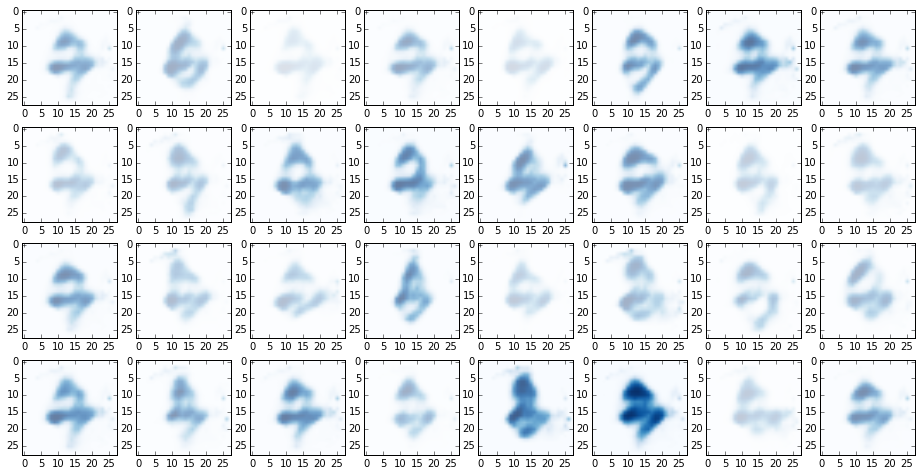

In [80]:
figsize(16, 8)

def ShowComponentWeights(digit):
    print "Average Activations of the Most Compressed Hidden Layer for Digit '{i}'".format(i=digit)
    _, axes = plt.subplots(4, 8)
    axes = axes.reshape(32)
    max_weight = hidden_archetypes[digit].max() + 1
    for x, comp in enumerate(components):
        weight = (hidden_archetypes[digit][x] + 1) / max_weight
        axes[x].imshow(comp, alpha=weight, cmap=cm.Blues)

ShowComponentWeights(1)

### Visualizae "Archetypal" Images for Each Digit

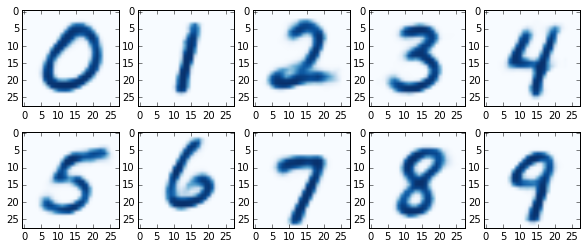

In [81]:
figsize(10, 4)
_, axes = plt.subplots(2, 5)
axes = axes.reshape(10)
for x, im in enumerate(y_image.eval(feed_dict={h_enc4: np.array(hidden_archetypes)})):
    axes[x].imshow(im, cmap=cm.Blues)

### Mixes between the compressed representations of different digits

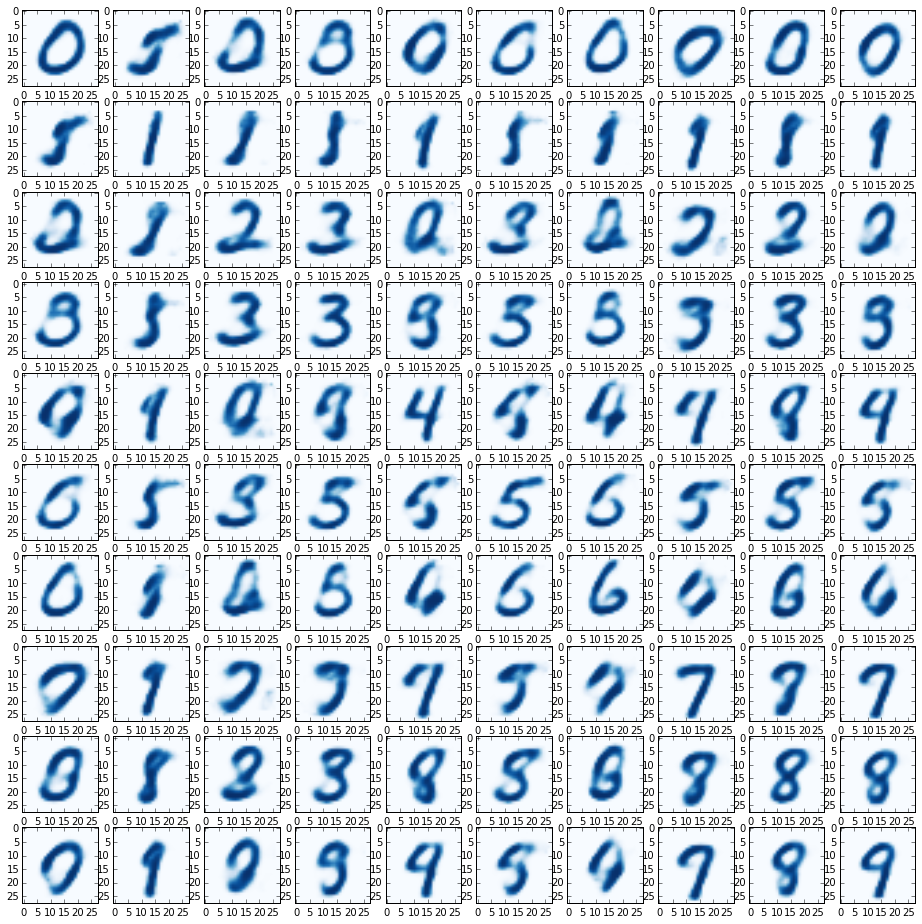

In [82]:
figsize(16, 16)
_, axes = plt.subplots(10, 10)
axes = axes.reshape(100)
for i in xrange(10):
    for j in xrange(10):
        mix = (0.55 * hidden_archetypes[i]) + (0.45 * hidden_archetypes[j])
        x = (10 * i) + j
        im = y_image.eval(feed_dict={h_enc4: np.array(mix).reshape(1, 32)}).reshape(28, 28)
        axes[x].imshow(im, cmap=cm.Blues)

### Illustration of Denoising
Noisy inputs on top row, resulting denoised reconstruction along the bottom.

#### Uniformly Distributed Noise

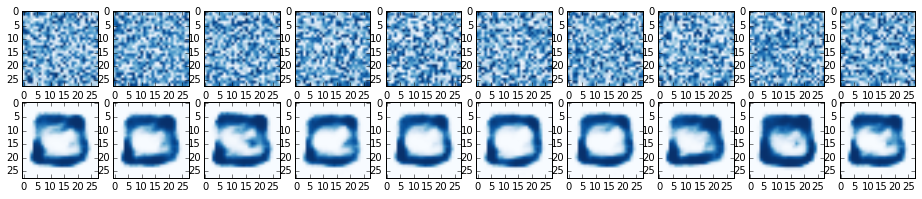

In [98]:
figsize(16, 3)

noise = np.random.random(size=(10, 28, 28))
denoised = y_image.eval(feed_dict={x_scaled: noise})
_, axes = plt.subplots(2, 10)
axes = axes.reshape(20)
for x in xrange(10):
    axes[x].imshow(noise[x], cmap=cm.Blues)
    axes[x + 10].imshow(denoised[x], cmap=cm.Blues)
plt.show()

#### Overlaid pairs of digits

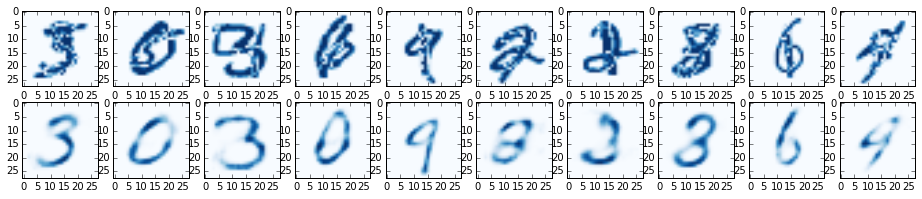

In [105]:
mixed = (train_im[:10] + train_im[10:20]) / 510.0
denoised = y_image.eval(feed_dict={x_scaled: mixed})
_, axes = plt.subplots(2, 10)
axes = axes.reshape(20)
for x in xrange(10):
    axes[x].imshow(mixed[x], cmap=cm.Blues)
    axes[x + 10].imshow(denoised[x], cmap=cm.Blues)
    

#### Randomly set pixels to 0 or 1
- Top row: source image.
- Second: Random noise.
- Third: max(source, noise)
- Fourth: Autoencoder output for max(source, noise)
- Second-but-last: min(source, noise)
- Last row: Autoencoder output for min(source, noise)

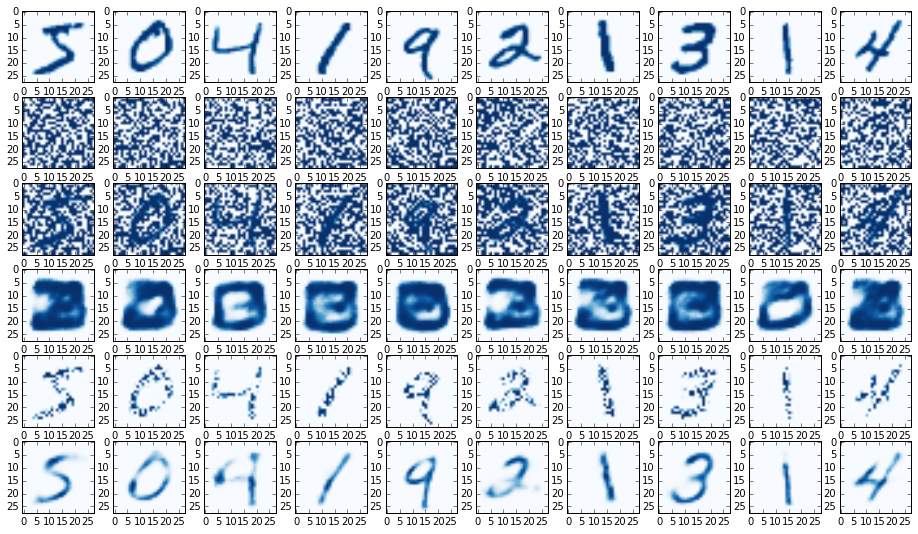

In [132]:
figsize(16, 9)

noise = np.random.randint(0, 2, size=(1, 10, 28, 28))
noised_max = np.vstack((noise, (train_im[:10] / 255.0).reshape(1, 10, 28, 28))).max(axis=0)
noised_min = np.vstack((noise, (train_im[:10] / 255.0).reshape(1, 10, 28, 28))).min(axis=0)
denoised_max = y_image.eval(feed_dict={x_scaled: noised_max})
denoised_min = y_image.eval(feed_dict={x_scaled: noised_min})

_, axes = plt.subplots(6, 10)
axes = axes.reshape(60)
for x in xrange(10):
    axes[x].imshow(train_im[x], cmap=cm.Blues)
    axes[x + 10].imshow(noise[0][x], cmap=cm.Blues)
    axes[x + 20].imshow(noised_max[x], cmap=cm.Blues)
    axes[x + 30].imshow(denoised_max[x], cmap=cm.Blues)
    axes[x + 40].imshow(noised_min[x], cmap=cm.Blues)
    axes[x + 50].imshow(denoised_min[x], cmap=cm.Blues)

## Real Denoising Autoencoder
As you can see, the simple autoencoder is pretty good at enhancing images where pixels have been taken out, but rather bad at sharpening images where extra pixels have been darkened.

Here's a shot at a true denoising autoencoder. The only difference here is that we're using corrupted inputs: a third of inputs have half the pixels randomly set to minimum brightness, and a third have half the pixels randomly set to max brightness. The remaining third are uncorrupted.

In [48]:
# New objective function that disentangles inputs and targets.
x_ = tf.placeholder(tf.float32, [None, 28, 28])
dn_mse = tf.reduce_mean(tf.pow(y - x_, 2))
dn_train_step = tf.train.AdamOptimizer(0.001).minimize(dn_mse)

# Reinitialize the autoencoder, without changing network structure.
sess.run(tf.initialize_all_variables())


START OF EPOCH 0: MSE=2.317e-01
Noising inputs...


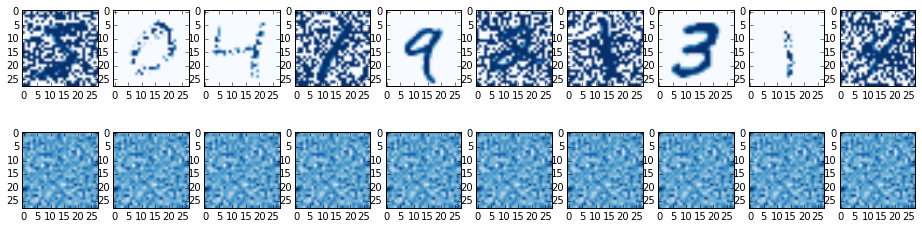

Finished epoch 0, batch 249 after 14.78 sec: MSE=6.271e-02, max activation=2.428e+00
Finished epoch 0, batch 499 after 23.58 sec: MSE=6.177e-02, max activation=2.462e+00

START OF EPOCH 1: MSE=6.404e-02
Noising inputs...


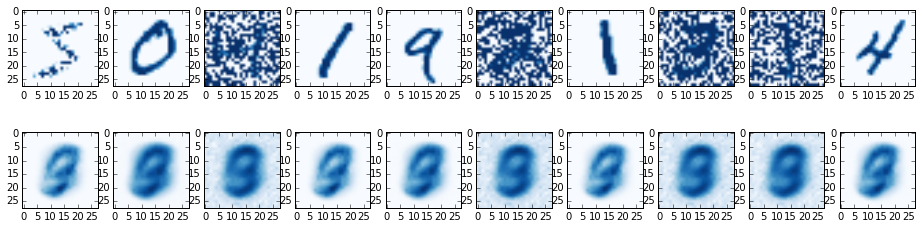

Finished epoch 1, batch 249 after 41.12 sec: MSE=6.132e-02, max activation=2.260e+00
Finished epoch 1, batch 499 after 49.12 sec: MSE=6.117e-02, max activation=2.404e+00

START OF EPOCH 2: MSE=6.364e-02
Noising inputs...


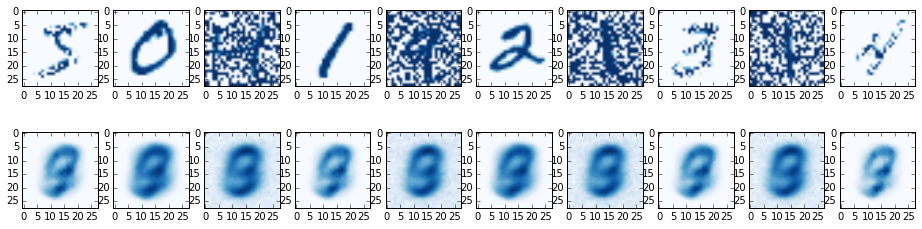

Finished epoch 2, batch 249 after 68.12 sec: MSE=6.115e-02, max activation=2.912e+00
Finished epoch 2, batch 499 after 75.13 sec: MSE=6.112e-02, max activation=4.116e+00

START OF EPOCH 3: MSE=6.384e-02
Noising inputs...


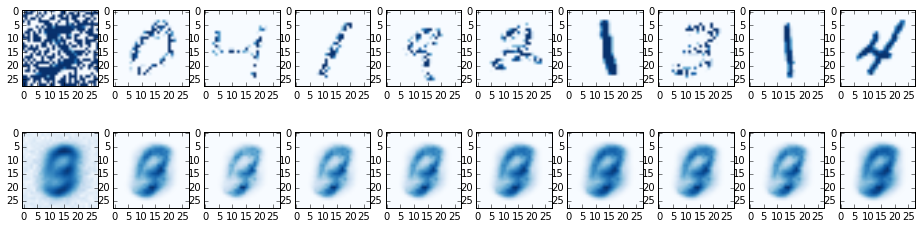

Finished epoch 3, batch 249 after 92.87 sec: MSE=6.110e-02, max activation=4.348e+00
Finished epoch 3, batch 499 after 100.43 sec: MSE=6.115e-02, max activation=4.588e+00

START OF EPOCH 4: MSE=6.377e-02
Noising inputs...


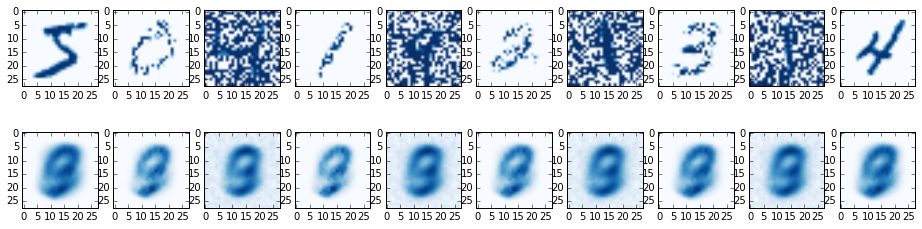

Finished epoch 4, batch 249 after 117.17 sec: MSE=6.105e-02, max activation=4.543e+00
Finished epoch 4, batch 499 after 124.80 sec: MSE=6.099e-02, max activation=4.873e+00

START OF EPOCH 5: MSE=6.381e-02
Noising inputs...


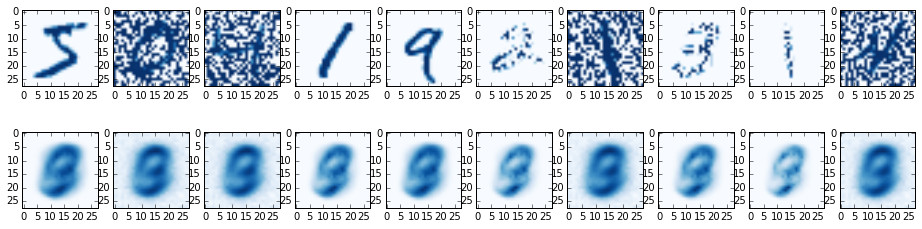

Finished epoch 5, batch 249 after 140.92 sec: MSE=6.087e-02, max activation=4.942e+00
Finished epoch 5, batch 499 after 148.00 sec: MSE=6.092e-02, max activation=4.991e+00

START OF EPOCH 6: MSE=6.357e-02
Noising inputs...


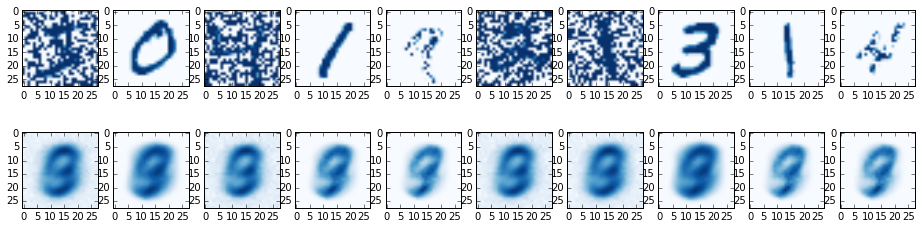

Finished epoch 6, batch 249 after 163.38 sec: MSE=6.102e-02, max activation=5.249e+00
Finished epoch 6, batch 499 after 171.14 sec: MSE=6.097e-02, max activation=5.507e+00

START OF EPOCH 7: MSE=6.362e-02
Noising inputs...


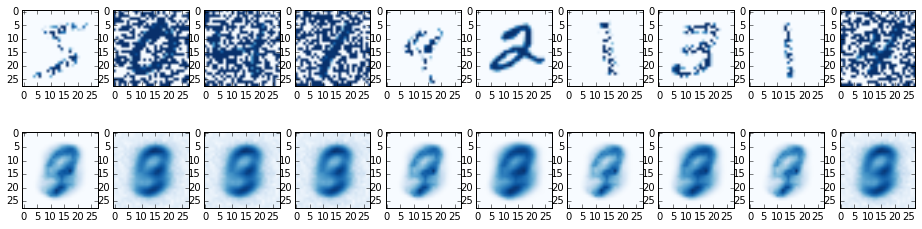

Finished epoch 7, batch 249 after 188.79 sec: MSE=6.106e-02, max activation=5.638e+00
Finished epoch 7, batch 499 after 195.95 sec: MSE=6.087e-02, max activation=5.804e+00

START OF EPOCH 8: MSE=6.344e-02
Noising inputs...


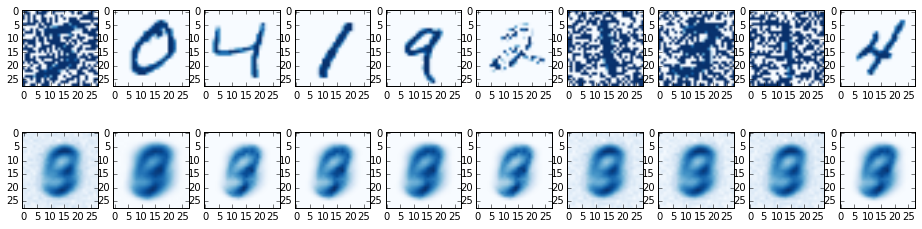

Finished epoch 8, batch 249 after 212.25 sec: MSE=6.089e-02, max activation=5.860e+00
Finished epoch 8, batch 499 after 219.88 sec: MSE=6.084e-02, max activation=6.032e+00

START OF EPOCH 9: MSE=6.350e-02
Noising inputs...


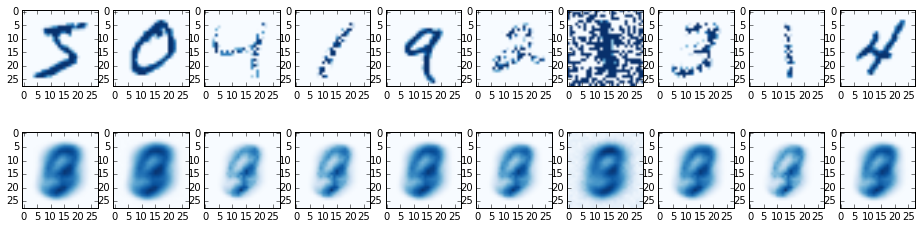

Finished epoch 9, batch 249 after 236.88 sec: MSE=6.086e-02, max activation=6.002e+00
Finished epoch 9, batch 499 after 244.84 sec: MSE=6.086e-02, max activation=6.399e+00

START OF EPOCH 10: MSE=6.346e-02
Noising inputs...


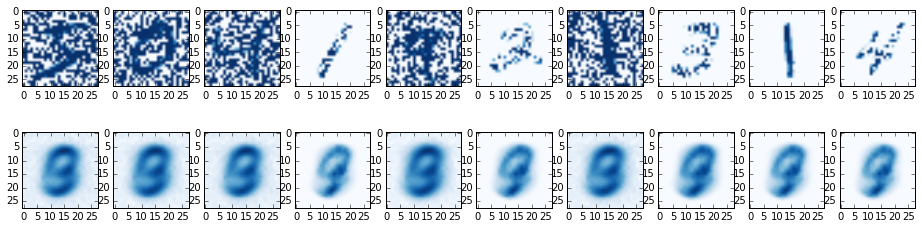

Finished epoch 10, batch 249 after 261.89 sec: MSE=6.085e-02, max activation=6.622e+00
Finished epoch 10, batch 499 after 268.86 sec: MSE=6.082e-02, max activation=6.807e+00

START OF EPOCH 11: MSE=6.352e-02
Noising inputs...


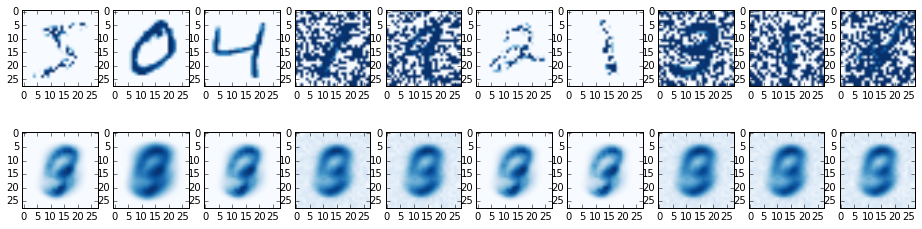

Finished epoch 11, batch 249 after 287.10 sec: MSE=6.087e-02, max activation=6.987e+00
Finished epoch 11, batch 499 after 294.34 sec: MSE=6.078e-02, max activation=7.190e+00

START OF EPOCH 12: MSE=6.325e-02
Noising inputs...


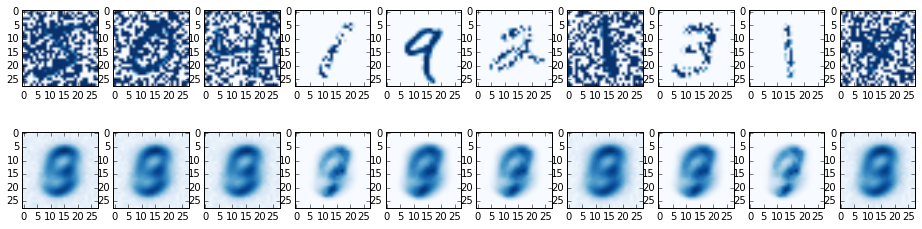

Finished epoch 12, batch 249 after 311.48 sec: MSE=6.078e-02, max activation=7.651e+00
Finished epoch 12, batch 499 after 318.39 sec: MSE=6.083e-02, max activation=7.493e+00

START OF EPOCH 13: MSE=6.336e-02
Noising inputs...


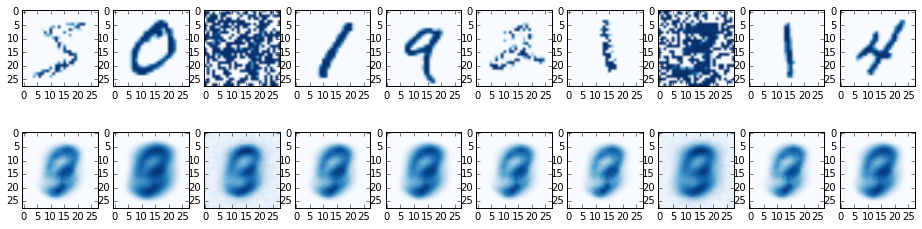

Finished epoch 13, batch 249 after 336.17 sec: MSE=6.083e-02, max activation=8.016e+00
Finished epoch 13, batch 499 after 343.87 sec: MSE=6.085e-02, max activation=8.111e+00

START OF EPOCH 14: MSE=6.332e-02
Noising inputs...


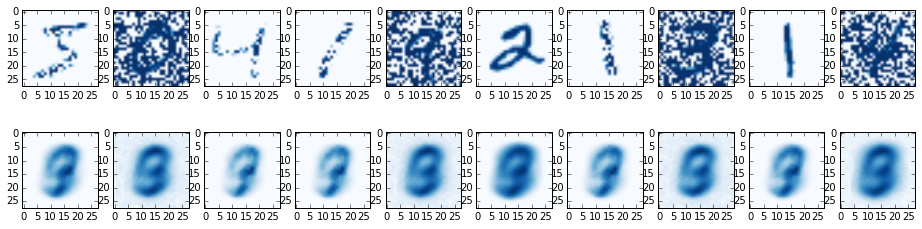

Finished epoch 14, batch 249 after 359.85 sec: MSE=6.080e-02, max activation=8.465e+00
Finished epoch 14, batch 499 after 366.46 sec: MSE=6.081e-02, max activation=8.512e+00

START OF EPOCH 15: MSE=6.330e-02
Noising inputs...


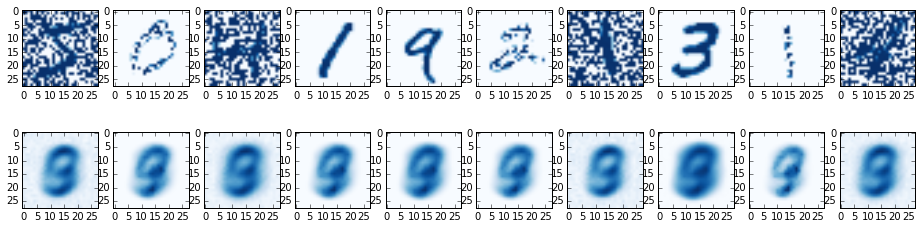

Finished epoch 15, batch 249 after 385.10 sec: MSE=6.083e-02, max activation=8.808e+00
Finished epoch 15, batch 499 after 392.36 sec: MSE=6.069e-02, max activation=8.756e+00

START OF EPOCH 16: MSE=6.333e-02
Noising inputs...


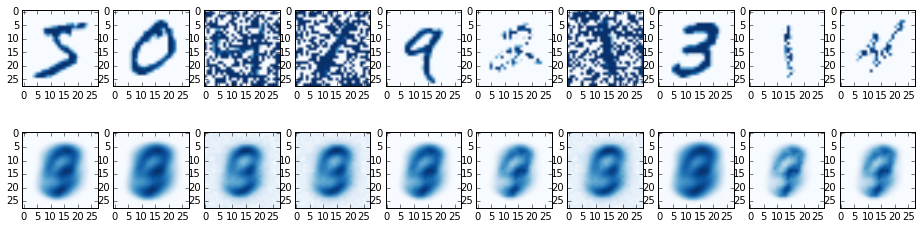

Finished epoch 16, batch 249 after 409.33 sec: MSE=6.078e-02, max activation=9.080e+00
Finished epoch 16, batch 499 after 416.93 sec: MSE=6.075e-02, max activation=9.397e+00

START OF EPOCH 17: MSE=6.331e-02
Noising inputs...


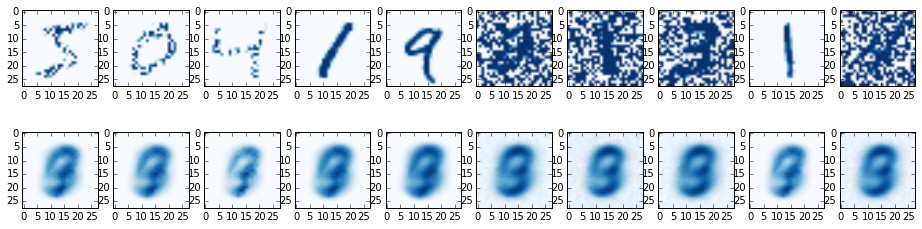

Finished epoch 17, batch 249 after 433.61 sec: MSE=6.071e-02, max activation=9.451e+00
Finished epoch 17, batch 499 after 441.01 sec: MSE=6.079e-02, max activation=9.356e+00

START OF EPOCH 18: MSE=6.325e-02
Noising inputs...


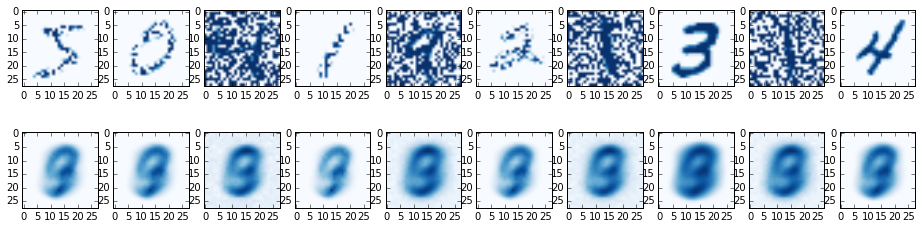

Finished epoch 18, batch 249 after 457.70 sec: MSE=6.071e-02, max activation=9.633e+00
Finished epoch 18, batch 499 after 465.15 sec: MSE=6.077e-02, max activation=9.531e+00

START OF EPOCH 19: MSE=6.328e-02
Noising inputs...


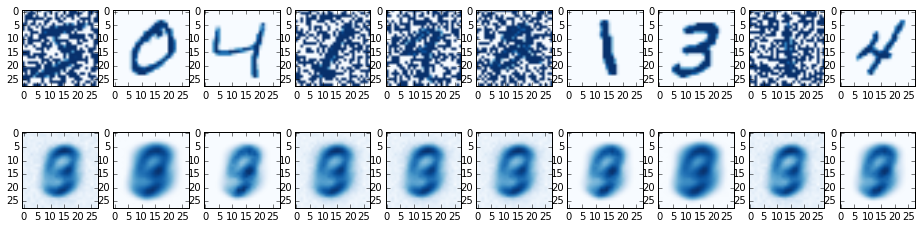

Finished epoch 19, batch 249 after 483.12 sec: MSE=6.063e-02, max activation=9.772e+00
Finished epoch 19, batch 499 after 490.74 sec: MSE=6.102e-02, max activation=9.120e+00

START OF EPOCH 20: MSE=5.798e-02
Noising inputs...


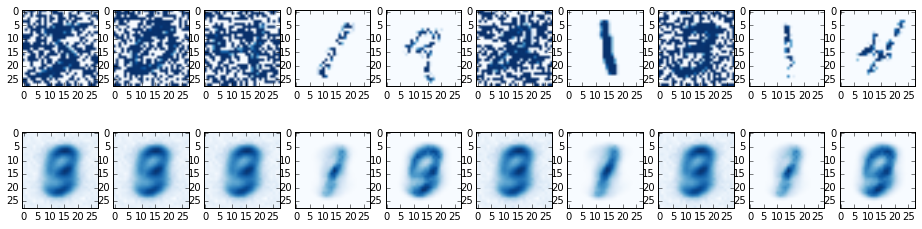

Finished epoch 20, batch 249 after 508.13 sec: MSE=5.469e-02, max activation=9.473e+00
Finished epoch 20, batch 499 after 515.81 sec: MSE=5.457e-02, max activation=9.641e+00

START OF EPOCH 21: MSE=5.712e-02
Noising inputs...


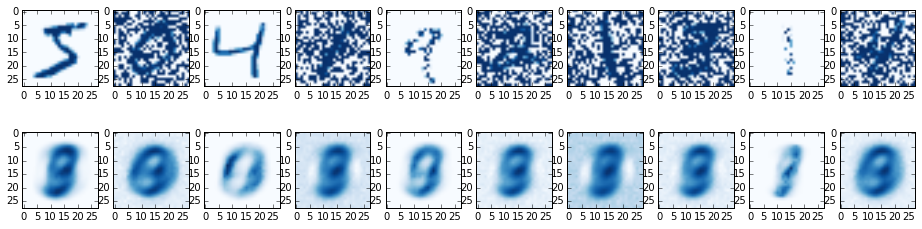

Finished epoch 21, batch 249 after 533.95 sec: MSE=5.147e-02, max activation=8.702e+00
Finished epoch 21, batch 499 after 540.59 sec: MSE=4.944e-02, max activation=1.683e+01

START OF EPOCH 22: MSE=5.126e-02
Noising inputs...


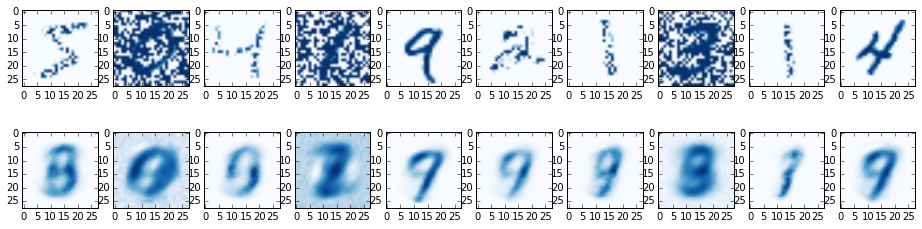

Finished epoch 22, batch 249 after 557.85 sec: MSE=4.789e-02, max activation=2.008e+01
Finished epoch 22, batch 499 after 565.40 sec: MSE=4.692e-02, max activation=2.511e+01

START OF EPOCH 23: MSE=4.790e-02
Noising inputs...


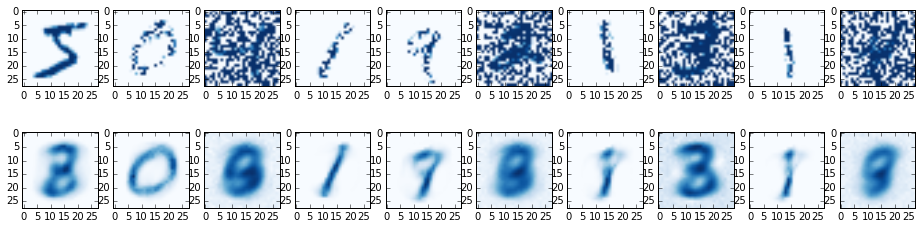

Finished epoch 23, batch 249 after 583.39 sec: MSE=4.512e-02, max activation=2.777e+01
Finished epoch 23, batch 499 after 590.10 sec: MSE=4.212e-02, max activation=3.050e+01

START OF EPOCH 24: MSE=4.272e-02
Noising inputs...


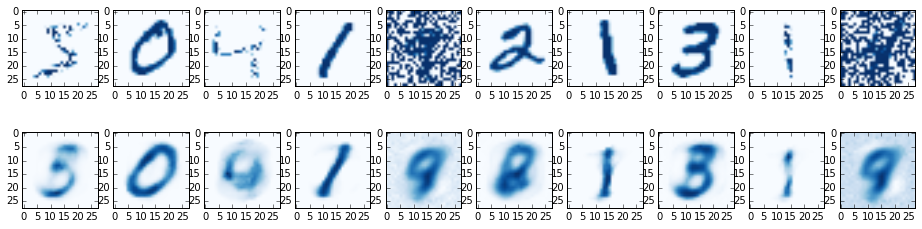

Finished epoch 24, batch 249 after 606.77 sec: MSE=4.096e-02, max activation=3.254e+01
Finished epoch 24, batch 499 after 614.24 sec: MSE=4.034e-02, max activation=3.345e+01

START OF EPOCH 25: MSE=4.071e-02
Noising inputs...


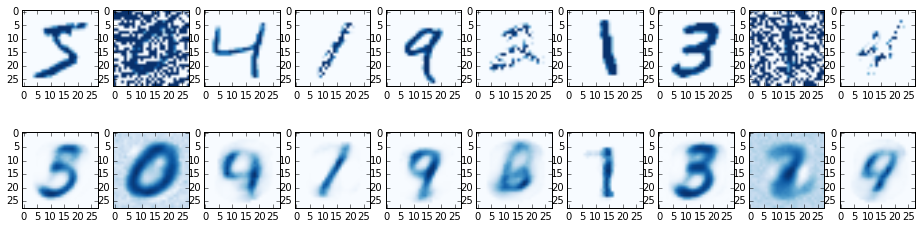

Finished epoch 25, batch 249 after 631.81 sec: MSE=3.935e-02, max activation=3.178e+01
Finished epoch 25, batch 499 after 639.80 sec: MSE=3.872e-02, max activation=3.254e+01

START OF EPOCH 26: MSE=3.999e-02
Noising inputs...


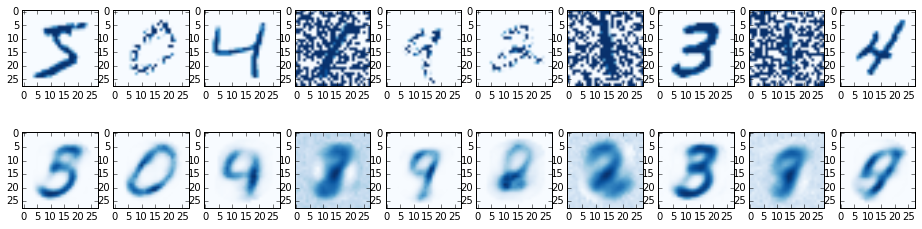

Finished epoch 26, batch 249 after 655.49 sec: MSE=3.772e-02, max activation=3.125e+01
Finished epoch 26, batch 499 after 663.21 sec: MSE=3.726e-02, max activation=2.931e+01

START OF EPOCH 27: MSE=3.912e-02
Noising inputs...


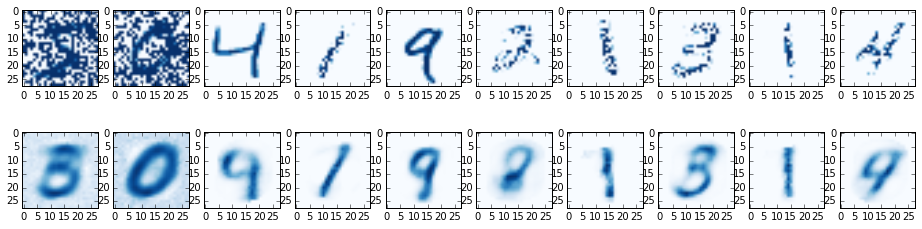

Finished epoch 27, batch 249 after 683.81 sec: MSE=3.670e-02, max activation=2.845e+01
Finished epoch 27, batch 499 after 691.23 sec: MSE=3.630e-02, max activation=2.912e+01

START OF EPOCH 28: MSE=3.781e-02
Noising inputs...


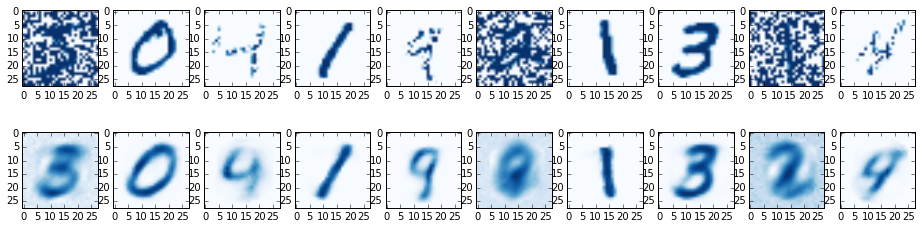

Finished epoch 28, batch 249 after 708.02 sec: MSE=3.568e-02, max activation=2.724e+01
Finished epoch 28, batch 499 after 714.27 sec: MSE=3.544e-02, max activation=2.679e+01

START OF EPOCH 29: MSE=3.652e-02
Noising inputs...


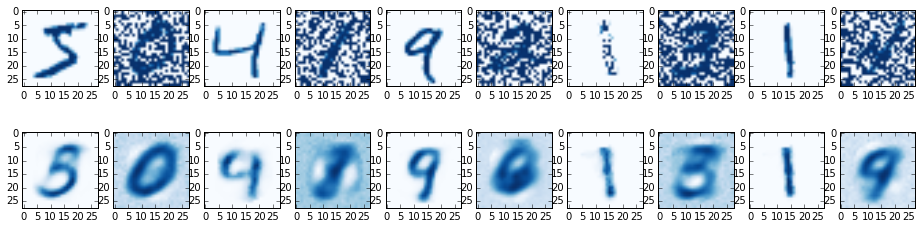

Finished epoch 29, batch 249 after 731.36 sec: MSE=3.409e-02, max activation=2.627e+01
Finished epoch 29, batch 499 after 738.57 sec: MSE=3.348e-02, max activation=2.598e+01

START OF EPOCH 30: MSE=3.453e-02
Noising inputs...


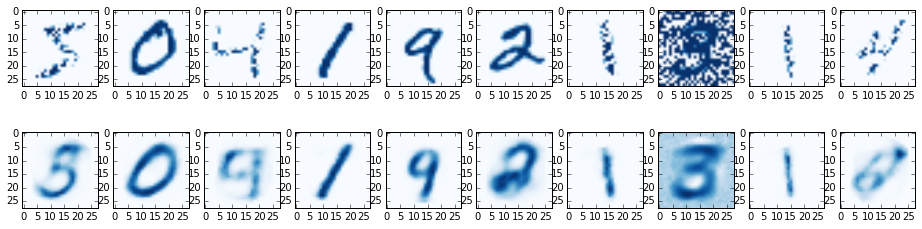

Finished epoch 30, batch 249 after 756.64 sec: MSE=3.266e-02, max activation=2.643e+01
Finished epoch 30, batch 499 after 764.39 sec: MSE=3.266e-02, max activation=2.967e+01

START OF EPOCH 31: MSE=3.385e-02
Noising inputs...


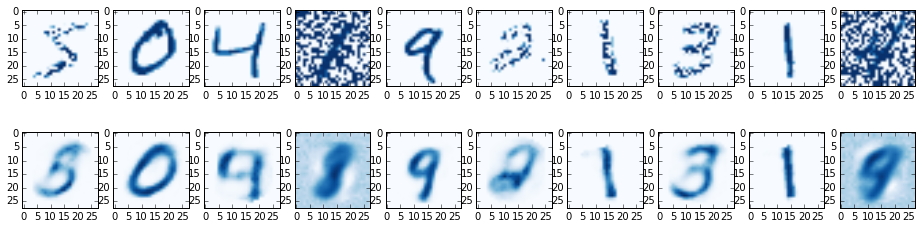

Finished epoch 31, batch 249 after 782.62 sec: MSE=3.150e-02, max activation=3.077e+01
Finished epoch 31, batch 499 after 789.73 sec: MSE=3.207e-02, max activation=3.220e+01

START OF EPOCH 32: MSE=3.242e-02
Noising inputs...


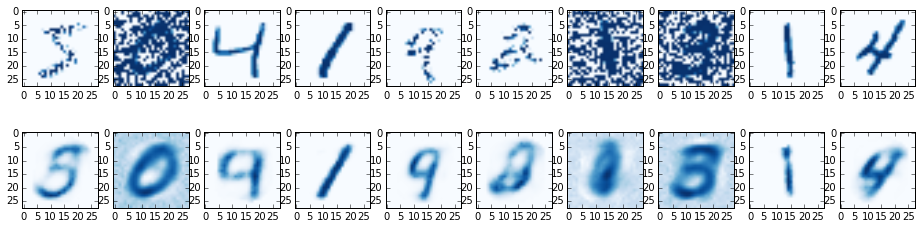

Finished epoch 32, batch 249 after 805.86 sec: MSE=3.143e-02, max activation=3.465e+01
Finished epoch 32, batch 499 after 813.09 sec: MSE=3.055e-02, max activation=3.246e+01

START OF EPOCH 33: MSE=3.070e-02
Noising inputs...


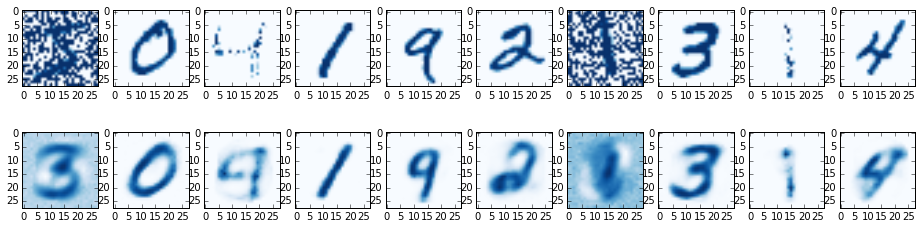

Finished epoch 33, batch 249 after 830.62 sec: MSE=2.850e-02, max activation=2.760e+01
Finished epoch 33, batch 499 after 838.45 sec: MSE=2.764e-02, max activation=2.589e+01

START OF EPOCH 34: MSE=3.049e-02
Noising inputs...


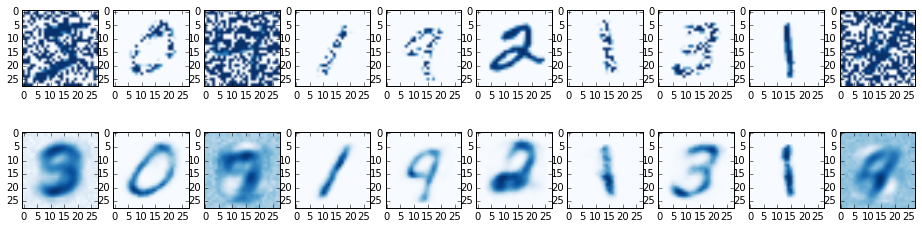

Finished epoch 34, batch 249 after 854.96 sec: MSE=2.671e-02, max activation=2.488e+01
Finished epoch 34, batch 499 after 862.54 sec: MSE=2.658e-02, max activation=2.482e+01

START OF EPOCH 35: MSE=2.685e-02
Noising inputs...


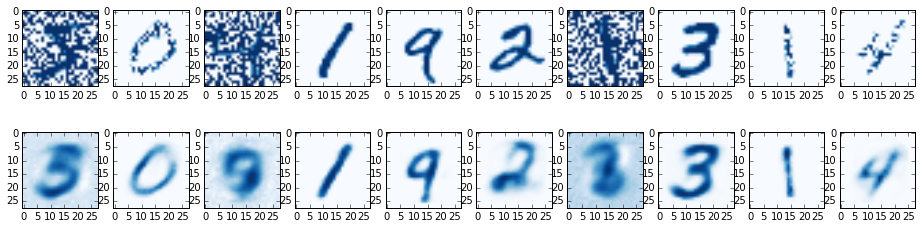

Finished epoch 35, batch 249 after 880.03 sec: MSE=2.543e-02, max activation=2.322e+01
Finished epoch 35, batch 499 after 886.72 sec: MSE=2.472e-02, max activation=2.275e+01

START OF EPOCH 36: MSE=2.578e-02
Noising inputs...


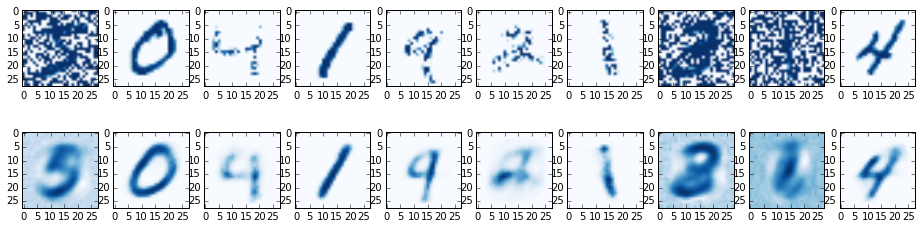

Finished epoch 36, batch 249 after 904.89 sec: MSE=2.410e-02, max activation=2.422e+01
Finished epoch 36, batch 499 after 912.64 sec: MSE=2.356e-02, max activation=2.319e+01

START OF EPOCH 37: MSE=2.479e-02
Noising inputs...


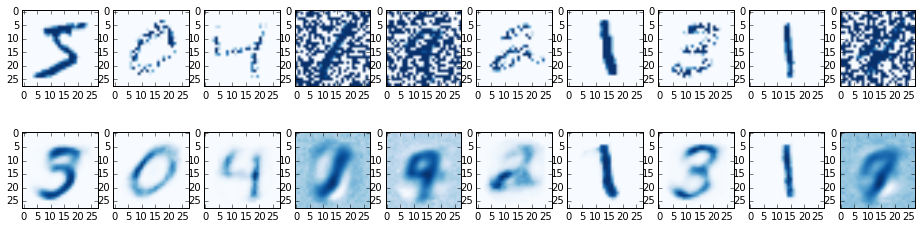

Finished epoch 37, batch 249 after 930.11 sec: MSE=2.311e-02, max activation=2.444e+01
Finished epoch 37, batch 499 after 936.85 sec: MSE=2.255e-02, max activation=2.344e+01

START OF EPOCH 38: MSE=2.442e-02
Noising inputs...


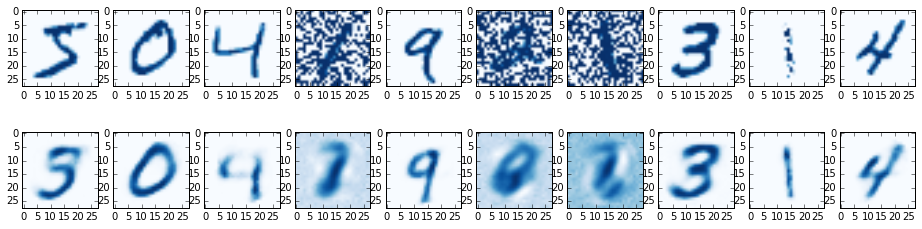

Finished epoch 38, batch 249 after 953.50 sec: MSE=2.213e-02, max activation=2.478e+01
Finished epoch 38, batch 499 after 961.16 sec: MSE=2.205e-02, max activation=2.477e+01

START OF EPOCH 39: MSE=2.339e-02
Noising inputs...


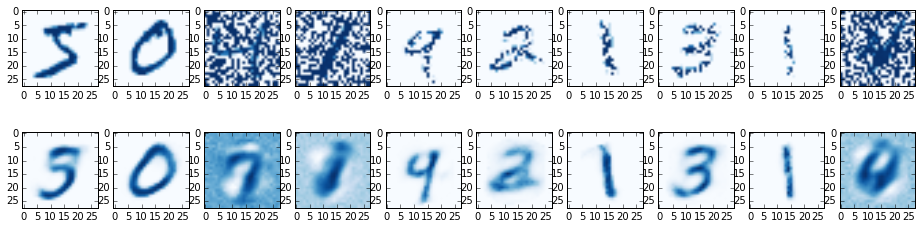

Finished epoch 39, batch 249 after 981.66 sec: MSE=2.155e-02, max activation=2.460e+01
Finished epoch 39, batch 499 after 989.60 sec: MSE=2.114e-02, max activation=2.515e+01

START OF EPOCH 40: MSE=2.287e-02
Noising inputs...


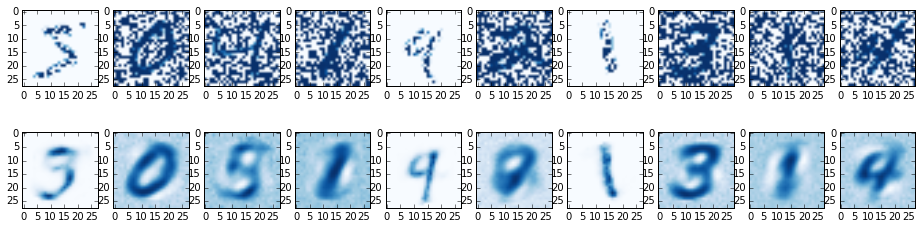

Finished epoch 40, batch 249 after 1005.99 sec: MSE=2.096e-02, max activation=2.542e+01
Finished epoch 40, batch 499 after 1013.09 sec: MSE=2.104e-02, max activation=2.474e+01

START OF EPOCH 41: MSE=2.224e-02
Noising inputs...


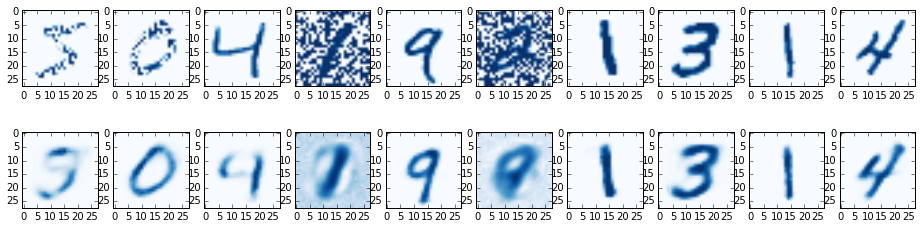

Finished epoch 41, batch 249 after 1030.55 sec: MSE=2.070e-02, max activation=2.576e+01
Finished epoch 41, batch 499 after 1037.74 sec: MSE=2.027e-02, max activation=2.478e+01

START OF EPOCH 42: MSE=2.123e-02
Noising inputs...


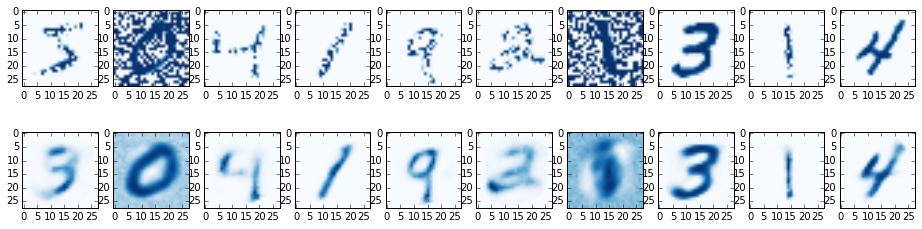

Finished epoch 42, batch 249 after 1054.37 sec: MSE=1.974e-02, max activation=2.503e+01
Finished epoch 42, batch 499 after 1062.11 sec: MSE=1.937e-02, max activation=2.463e+01

START OF EPOCH 43: MSE=2.015e-02
Noising inputs...


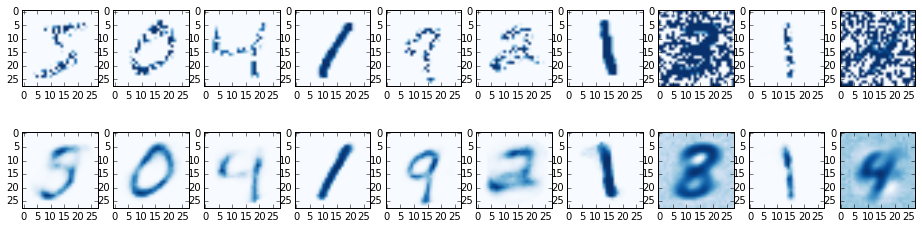

Finished epoch 43, batch 249 after 1079.59 sec: MSE=1.889e-02, max activation=2.390e+01
Finished epoch 43, batch 499 after 1086.80 sec: MSE=1.889e-02, max activation=2.384e+01

START OF EPOCH 44: MSE=1.942e-02
Noising inputs...


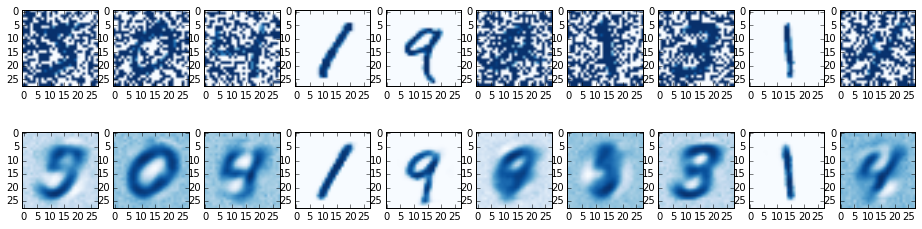

Finished epoch 44, batch 249 after 1103.17 sec: MSE=1.824e-02, max activation=2.401e+01
Finished epoch 44, batch 499 after 1109.93 sec: MSE=1.783e-02, max activation=2.350e+01

START OF EPOCH 45: MSE=1.921e-02
Noising inputs...


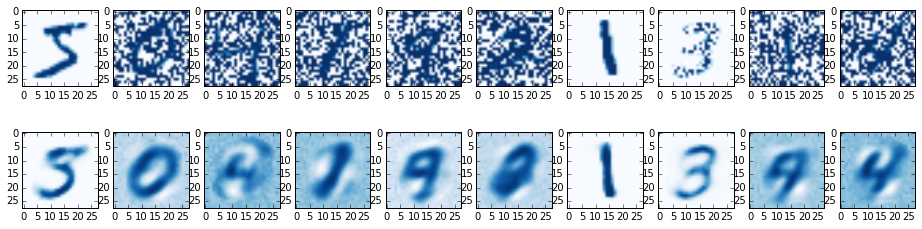

Finished epoch 45, batch 249 after 1131.48 sec: MSE=1.782e-02, max activation=2.303e+01
Finished epoch 45, batch 499 after 1138.65 sec: MSE=1.784e-02, max activation=2.236e+01

START OF EPOCH 46: MSE=1.837e-02
Noising inputs...


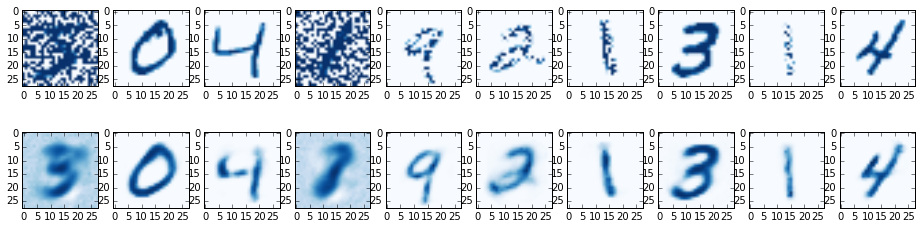

Finished epoch 46, batch 249 after 1155.48 sec: MSE=1.759e-02, max activation=2.158e+01
Finished epoch 46, batch 499 after 1162.89 sec: MSE=1.727e-02, max activation=2.184e+01

START OF EPOCH 47: MSE=1.820e-02
Noising inputs...


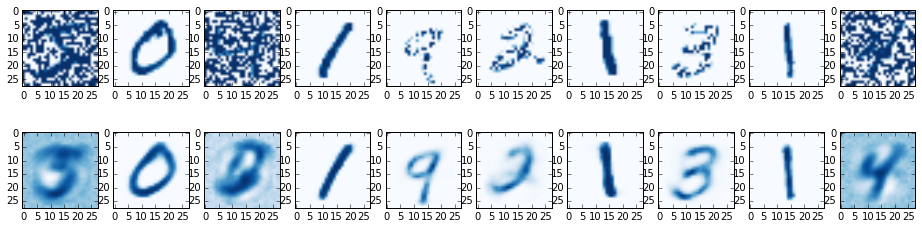

Finished epoch 47, batch 249 after 1180.07 sec: MSE=1.732e-02, max activation=2.099e+01
Finished epoch 47, batch 499 after 1187.52 sec: MSE=1.717e-02, max activation=2.110e+01

START OF EPOCH 48: MSE=1.773e-02
Noising inputs...


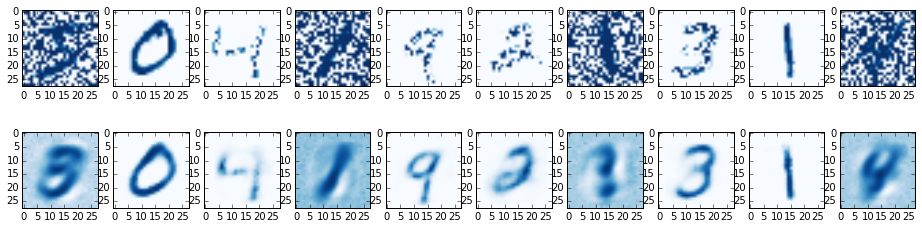

Finished epoch 48, batch 249 after 1203.95 sec: MSE=1.677e-02, max activation=1.978e+01
Finished epoch 48, batch 499 after 1211.33 sec: MSE=1.660e-02, max activation=1.926e+01

START OF EPOCH 49: MSE=1.697e-02
Noising inputs...


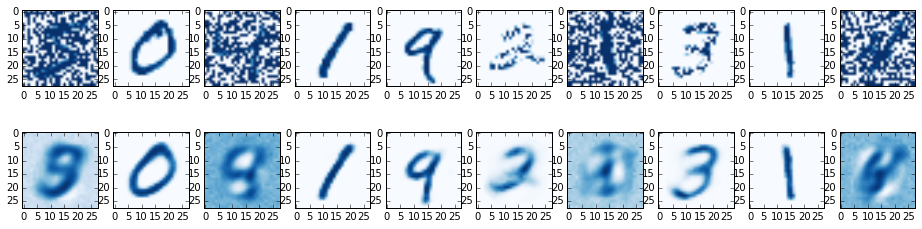

Finished epoch 49, batch 249 after 1231.94 sec: MSE=1.643e-02, max activation=1.884e+01
Finished epoch 49, batch 499 after 1240.15 sec: MSE=1.600e-02, max activation=1.889e+01

START OF EPOCH 50: MSE=1.688e-02
Noising inputs...


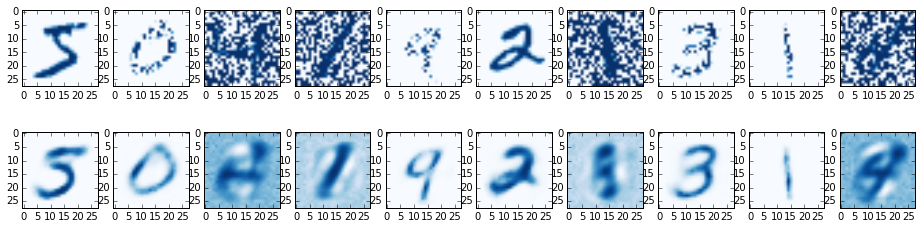

Finished epoch 50, batch 249 after 1258.32 sec: MSE=1.565e-02, max activation=1.894e+01
Finished epoch 50, batch 499 after 1265.67 sec: MSE=1.562e-02, max activation=1.947e+01

START OF EPOCH 51: MSE=1.596e-02
Noising inputs...


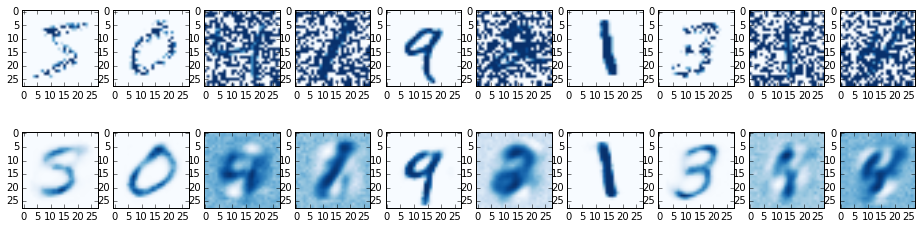

Finished epoch 51, batch 249 after 1283.20 sec: MSE=1.543e-02, max activation=1.942e+01
Finished epoch 51, batch 499 after 1290.16 sec: MSE=1.527e-02, max activation=1.956e+01

START OF EPOCH 52: MSE=1.586e-02
Noising inputs...


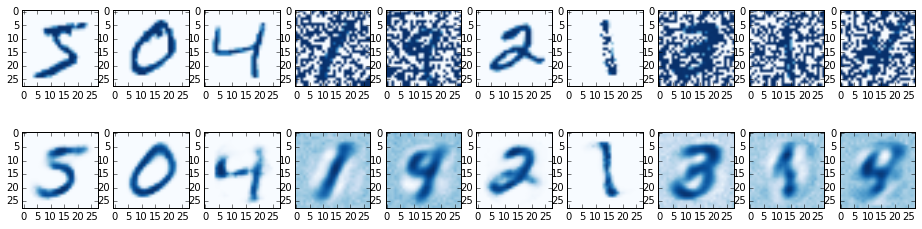

Finished epoch 52, batch 249 after 1307.19 sec: MSE=1.502e-02, max activation=1.920e+01
Finished epoch 52, batch 499 after 1314.57 sec: MSE=1.511e-02, max activation=1.958e+01

START OF EPOCH 53: MSE=1.539e-02
Noising inputs...


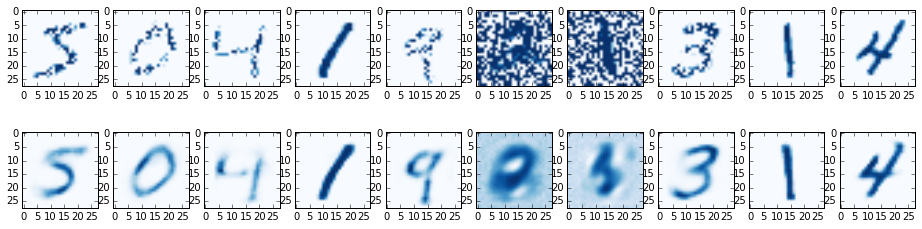

Finished epoch 53, batch 249 after 1332.82 sec: MSE=1.484e-02, max activation=1.909e+01
Finished epoch 53, batch 499 after 1340.65 sec: MSE=1.468e-02, max activation=1.948e+01

START OF EPOCH 54: MSE=1.503e-02
Noising inputs...


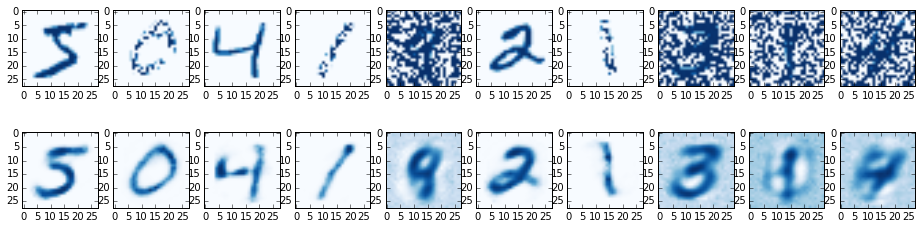

Finished epoch 54, batch 249 after 1357.93 sec: MSE=1.459e-02, max activation=1.944e+01
Finished epoch 54, batch 499 after 1364.89 sec: MSE=1.416e-02, max activation=1.923e+01

START OF EPOCH 55: MSE=1.433e-02
Noising inputs...


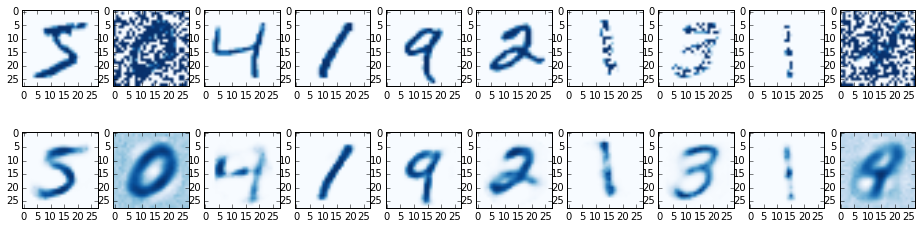

Finished epoch 55, batch 249 after 1385.78 sec: MSE=1.398e-02, max activation=1.899e+01
Finished epoch 55, batch 499 after 1394.18 sec: MSE=1.368e-02, max activation=1.926e+01

START OF EPOCH 56: MSE=1.374e-02
Noising inputs...


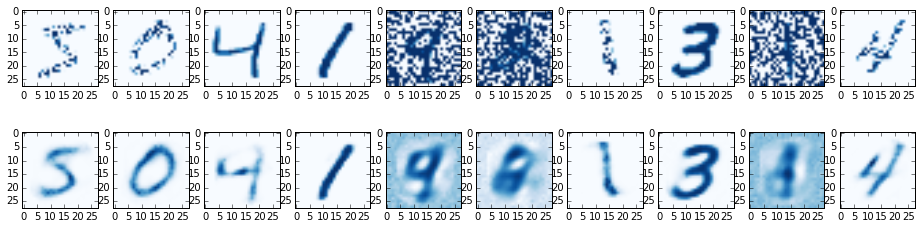

Finished epoch 56, batch 249 after 1410.97 sec: MSE=1.354e-02, max activation=1.897e+01
Finished epoch 56, batch 499 after 1418.23 sec: MSE=1.337e-02, max activation=1.959e+01

START OF EPOCH 57: MSE=1.359e-02
Noising inputs...


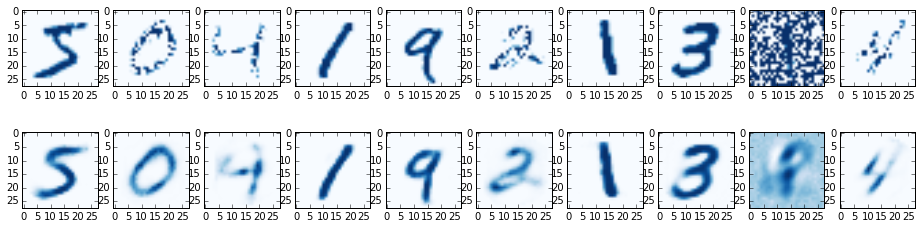

Finished epoch 57, batch 249 after 1435.55 sec: MSE=1.318e-02, max activation=1.930e+01
Finished epoch 57, batch 499 after 1443.30 sec: MSE=1.317e-02, max activation=1.944e+01

START OF EPOCH 58: MSE=1.321e-02
Noising inputs...


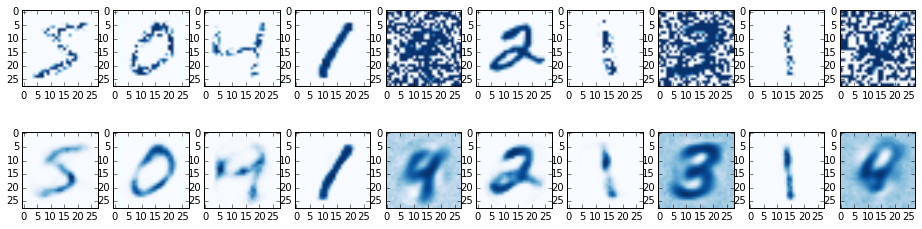

Finished epoch 58, batch 249 after 1461.06 sec: MSE=1.275e-02, max activation=1.963e+01
Finished epoch 58, batch 499 after 1469.18 sec: MSE=1.263e-02, max activation=1.982e+01

START OF EPOCH 59: MSE=1.325e-02
Noising inputs...


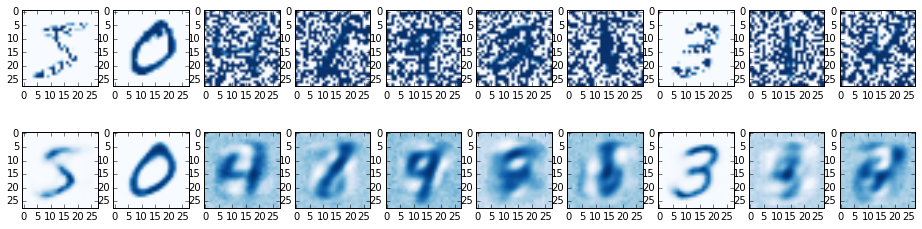

Finished epoch 59, batch 249 after 1488.59 sec: MSE=1.258e-02, max activation=1.949e+01
Finished epoch 59, batch 499 after 1496.12 sec: MSE=1.226e-02, max activation=1.976e+01


In [49]:
num_epochs = 60
batch_size = 100
test_every_n_batches = 250

figsize(16, 4)

batches_per_epoch = train_im.shape[0] / batch_size
mark = time.time()
for ep in xrange(num_epochs):
    er = mse.eval(feed_dict={x: test_im})
    print "\nSTART OF EPOCH {ep}: MSE={er:.3e}".format(ep=ep, er=er)

    # Noised training images
    print "Noising inputs..."
    noise = np.random.randint(0, 2, size=(1, 60000, 28, 28)) * 255
    train_im_reshaped = train_im.reshape(1, 60000, 28, 28)
    noised_max = np.vstack((noise, train_im_reshaped)).max(axis=0).reshape(1, 60000, 28, 28)
    noised_min = np.vstack((noise, train_im_reshaped)).min(axis=0).reshape(1, 60000, 28, 28)
    selections = np.random.randint(0, 3, size=(1, 60000, 1, 1))
    batch_input = np.vstack((
        noised_max * (selections == 0),
        noised_min * (selections == 1),
        train_im_reshaped * (selections == 2))).max(axis=0)
    
    # Visualization
    reconstructions = y_image.eval(feed_dict={x: batch_input[:10]})
    _, axes = plt.subplots(2, 10)
    axes = axes.reshape(20)
    for i in xrange(10):
        axes[i].imshow(batch_input[i], cmap=cm.Blues)
        axes[i + 10].imshow(reconstructions[i], cmap=cm.Blues)
    plt.show()

    for i in xrange(batches_per_epoch):
        start_offset = i * batch_size
        stop_offset = start_offset + batch_size
        train_step.run(feed_dict={
            x: batch_input[start_offset:stop_offset],
            x_: train_im[start_offset:stop_offset] / 255.0})
        if (i + 1) % test_every_n_batches == 0:
            er, he1, he2, hd1, hd2 = sess.run(
                [mse, h_enc1, h_enc2, h_dec1, h_dec2],
                feed_dict={x: test_im[:100]})
            mv = max(he1.max(), he2.max(), hd1.max(), hd2.max())
            print ("Finished epoch {ep}, batch {ba} after {t:.2f} sec: "
                   "MSE={er:.3e}, max activation={mv:.3e}").format(
                ep=ep, ba=i, t=time.time() - mark, er=er, mv=mv)
            sys.stdout.flush()

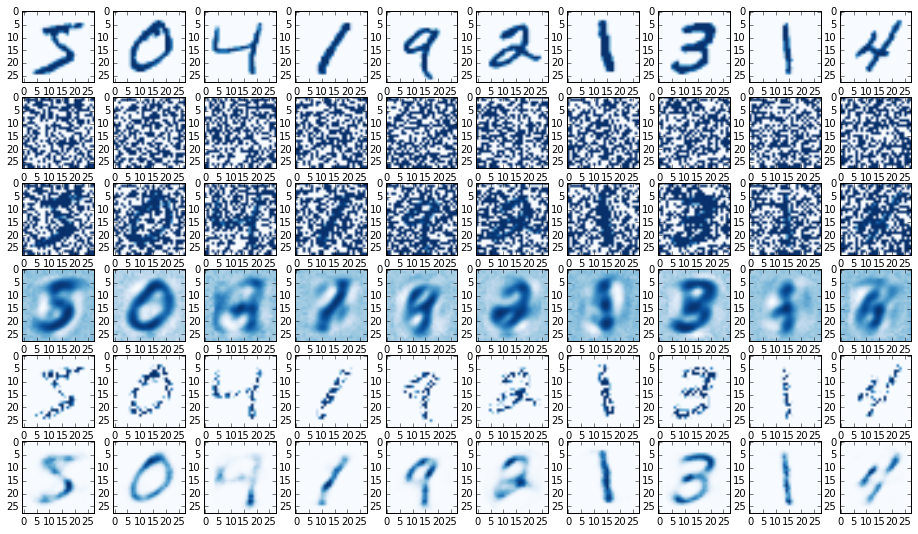

In [50]:
figsize(16, 9)

noise = np.random.randint(0, 2, size=(1, 10, 28, 28))
noised_max = np.vstack((noise, (train_im[:10] / 255.0).reshape(1, 10, 28, 28))).max(axis=0)
noised_min = np.vstack((noise, (train_im[:10] / 255.0).reshape(1, 10, 28, 28))).min(axis=0)
denoised_max = y_image.eval(feed_dict={x_scaled: noised_max})
denoised_min = y_image.eval(feed_dict={x_scaled: noised_min})

_, axes = plt.subplots(6, 10)
axes = axes.reshape(60)
for ax in xrange(10):
    axes[ax].imshow(train_im[ax], cmap=cm.Blues)
    axes[ax + 10].imshow(noise[0][ax], cmap=cm.Blues)
    axes[ax + 20].imshow(noised_max[ax], cmap=cm.Blues)
    axes[ax + 30].imshow(denoised_max[ax], cmap=cm.Blues)
    axes[ax + 40].imshow(noised_min[ax], cmap=cm.Blues)
    axes[ax + 50].imshow(denoised_min[ax], cmap=cm.Blues)